# Breast Cancer Campaign

### Import Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
%matplotlib inline

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

### Import Data and Explore

In [2]:
bc = pd.read_csv('data.csv')

In [3]:
bc.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
bc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
id                         569 non-null int64
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non

In [5]:
# Drop irrelevant columns
bc = bc.drop(columns=['id','Unnamed: 32'])

In [6]:
# Delete Missing Value Entries (if any)
bc = bc.dropna()

### Preprocessing

In [7]:
X = bc.drop(['diagnosis'],axis=1)
y = bc['diagnosis']

In [8]:
# Encoding Target
encoder = LabelEncoder()
y = encoder.fit_transform(y)

In [9]:
# Scaling and Normalization
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [10]:
bc_refined = bc

In [11]:
bc_refined['diagnosis'] = y

In [12]:
bc_refined.loc[:,~bc.columns.isin(['diagnosis'])]=X

In [13]:
bc_refined.to_csv('data_refined.csv',index=False)

### Visualization

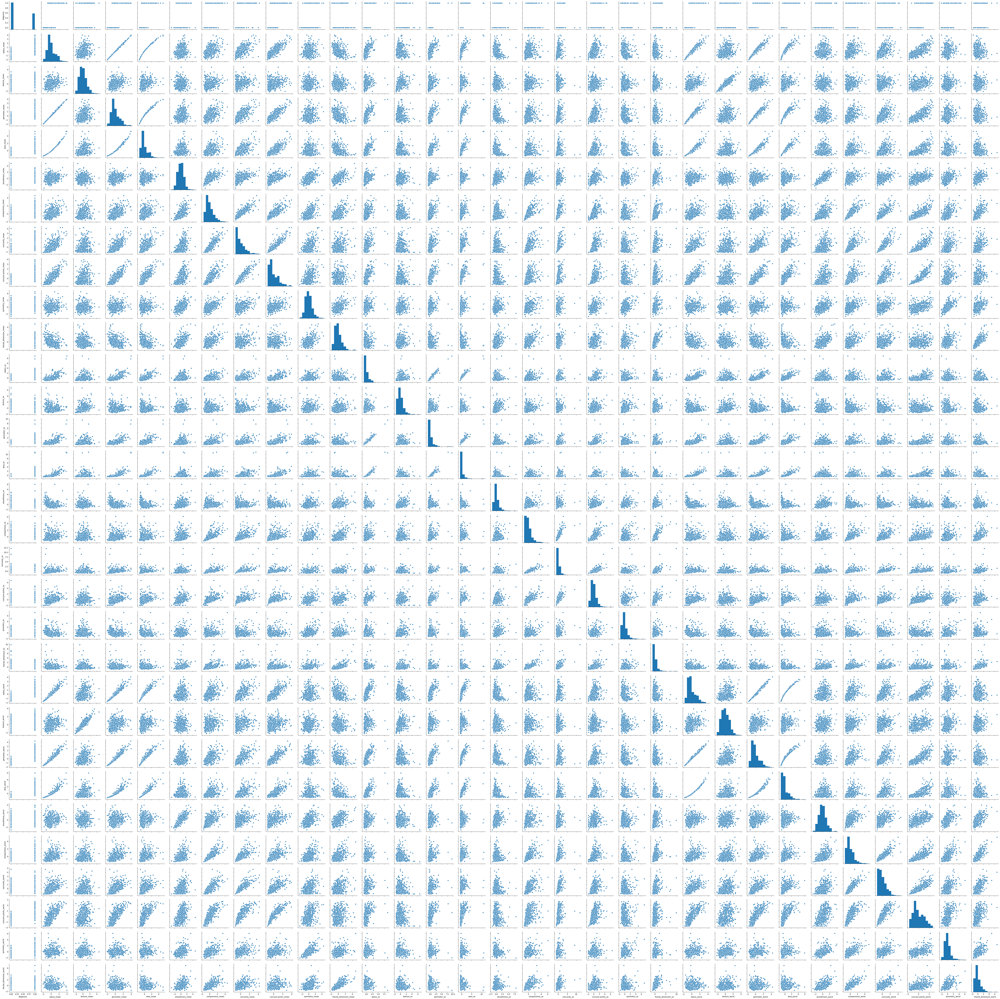

In [14]:
sns.pairplot(bc_refined)

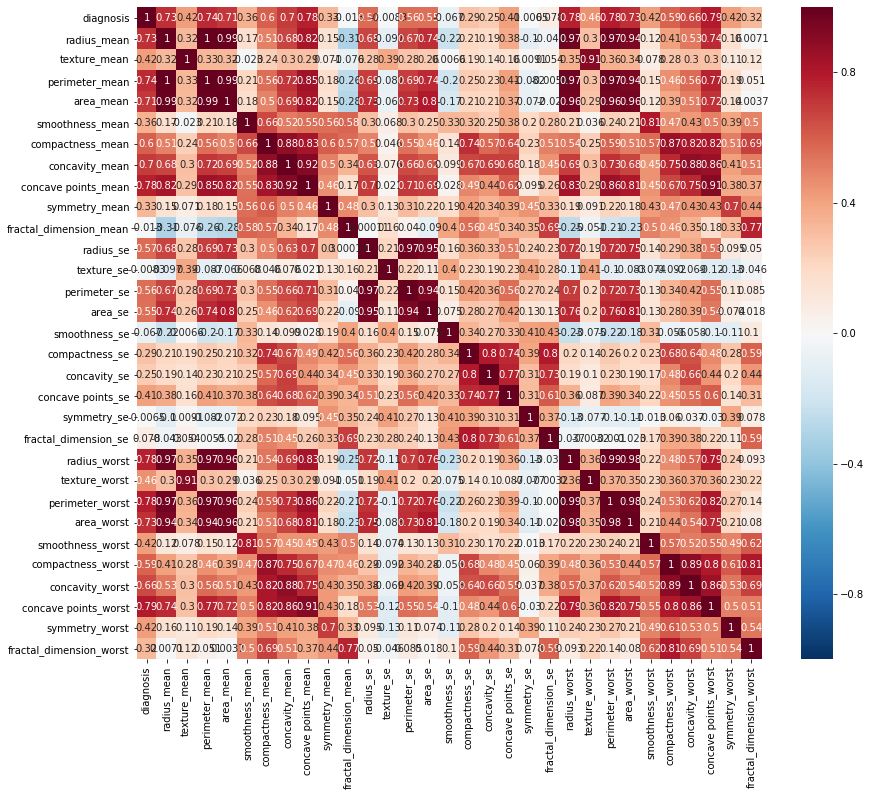

In [15]:
correlation = bc_refined.corr()
plt.figure(figsize=(14,12))
heatmap = sns.heatmap(correlation, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")

In [16]:
feat = list(bc_refined)
feat.remove('diagnosis')
feat

['radius_mean',
 'texture_mean',
 'perimeter_mean',
 'area_mean',
 'smoothness_mean',
 'compactness_mean',
 'concavity_mean',
 'concave points_mean',
 'symmetry_mean',
 'fractal_dimension_mean',
 'radius_se',
 'texture_se',
 'perimeter_se',
 'area_se',
 'smoothness_se',
 'compactness_se',
 'concavity_se',
 'concave points_se',
 'symmetry_se',
 'fractal_dimension_se',
 'radius_worst',
 'texture_worst',
 'perimeter_worst',
 'area_worst',
 'smoothness_worst',
 'compactness_worst',
 'concavity_worst',
 'concave points_worst',
 'symmetry_worst',
 'fractal_dimension_worst']

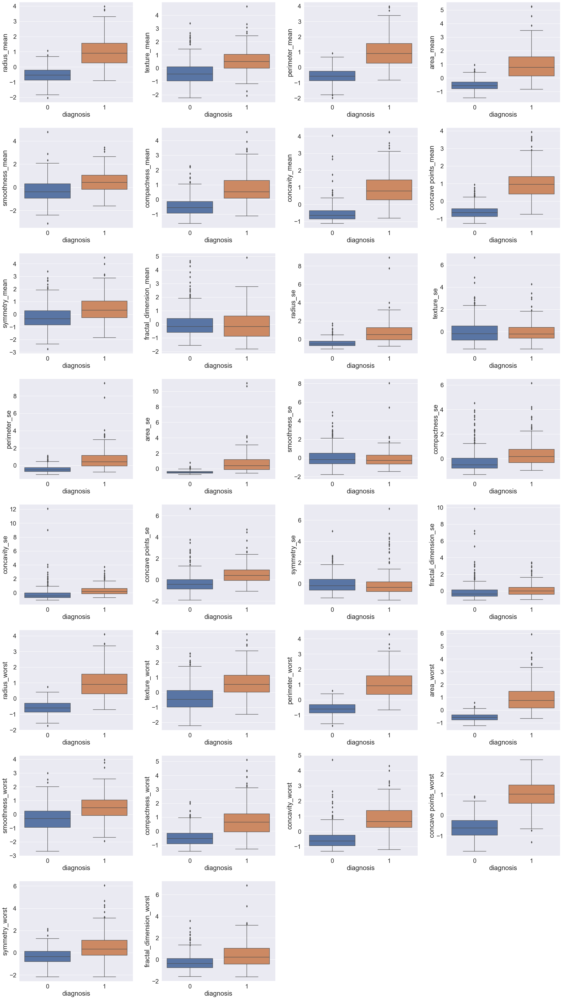

In [17]:
sns.set(font_scale=2)
fig, axes = plt.subplots(nrows=8, ncols=4, figsize=(35,65))
axes_list = [item for sublist in axes for item in sublist]
fig.subplots_adjust(hspace=0.25, wspace=0.25)

for i in feat:
    ax = axes_list.pop(0)
    sns.boxplot(x = 'diagnosis', y = i, data = bc_refined, ax=ax)
    for patch in ax.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b))

for ax in axes_list:
    ax.remove()

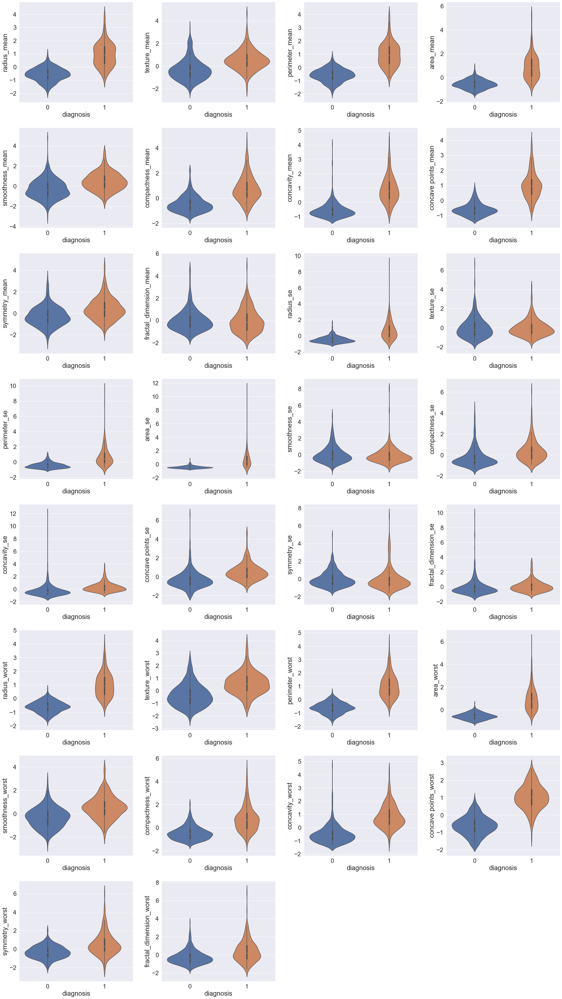

In [18]:
# Violin Plots
# They are visualizations that show both the distributiojn of data and its probability density.
# They are a combination of box plots (including the maximum, the minimum, the absolute median, the lower median, 
# and the upper median) and a density plot that is rotated and placed on each side.

sns.set(font_scale=2)
fig, axes = plt.subplots(nrows=8, ncols=4, figsize=(35,65))
axes_list = [item for sublist in axes for item in sublist]
fig.subplots_adjust(hspace=0.25, wspace=0.25)

for i in feat:
    ax = axes_list.pop(0)
    sns.violinplot(x = 'diagnosis', y = i, data = bc_refined, ax=ax)
    for patch in ax.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b))

for ax in axes_list:
    ax.remove()